## Importing Necessary frameworks and Laoding the Data:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import os
from tensorflow.keras.preprocessing import image
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/gan-getting-started/monet_jpg/f4413e97bd.jpg
/kaggle/input/gan-getting-started/monet_jpg/7341d96c1d.jpg
/kaggle/input/gan-getting-started/monet_jpg/de6f71b00f.jpg
/kaggle/input/gan-getting-started/monet_jpg/99d94af5dd.jpg
/kaggle/input/gan-getting-started/monet_jpg/99a51d3e25.jpg
/kaggle/input/gan-getting-started/monet_jpg/d05cab011d.jpg
/kaggle/input/gan-getting-started/monet_jpg/4e05523825.jpg
/kaggle/input/gan-getting-started/monet_jpg/c68c52e8fc.jpg
/kaggle/input/gan-getting-started/monet_jpg/40d7d18ad3.jpg
/kaggle/input/gan-getting-started/monet_jpg/f96a8de9f3.jpg
/kaggle/input/gan-getting-started/monet_jpg/79224da51f.jpg
/kaggle/input/gan-getting-started/monet_jpg/23832dead5.jpg
/kaggle/input/gan-getting-started/monet_jpg/85580214be.jpg
/kaggle/input/gan-getting-started/monet_jpg/47a0548067.jpg
/kaggle/input/gan-getting-started/monet_jpg/fb93438ff9.jpg
/kaggle/input/gan-getting-started/monet_jpg/89d970411d.jpg
/kaggle/input/gan-getting-started/monet_jpg/7960adbd50.j

## Preporocessing The Images:

In [2]:
gan_monet_contents = os.listdir("/kaggle/input/gan-getting-started")

In [3]:
# Using the tfrec files, because it's tensorflow friendly:
monet_tfrec_path = os.path.join('/kaggle/input/gan-getting-started/', 'monet_tfrec')
photo_tfrec_path = os.path.join('/kaggle/input/gan-getting-started/', 'photo_tfrec')

In [4]:
feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
}

In [5]:
def _parse_function(example_proto):
    # Parse the input `tf.train.Example` proto using the feature description:
    parsed_example = tf.io.parse_single_example(example_proto, feature_description)
    
    # Decode the image and reshape it:
    image = tf.io.decode_jpeg(parsed_example['image'])
    image = tf.image.resize(image, [256, 256])  # Resize to desired size
    image = (image / 127.5) - 1  # Normalize to [-1, 1]
    
    return image

In [6]:
## Gathering the tfrec Monet data:
monet_dataset = tf.data.Dataset.list_files(monet_tfrec_path + '/*.tfrec')
monet_dataset = monet_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
monet_dataset = monet_dataset.map(_parse_function)

In [7]:
## Gathering the tfrec Photos:
photo_dataset = tf.data.Dataset.list_files(photo_tfrec_path + '/*.tfrec')
photo_dataset = photo_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
photo_dataset = photo_dataset.map(_parse_function)

In [8]:
BUFFER_SIZE = 400
BATCH_SIZE = 32
monet_dataset = monet_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
photo_dataset = photo_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

monet_dataset, photo_dataset

(<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>,
 <_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>)

# Building The Model:

In [9]:
## Generator:
def make_generator_model():
    # Reshaping the images
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    
    # Encoder
    down1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    down2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(down1)
    down3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(down2)
    
    # Decoder
    up1 = tf.keras.layers.Conv2DTranspose(128, (4, 4), strides=2, padding='same', activation='relu')(down3)
    up2 = tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same', activation='relu')(up1)
    
    outputs = tf.keras.layers.Conv2DTranspose(3, (4, 4), strides=2, padding='same', activation='tanh')(up2)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [10]:
## Discriminator:
def make_discriminator_model():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    
    d1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    d2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(d1)
    d3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(d2)
    
    outputs = tf.keras.layers.Conv2D(1, (4, 4), padding='same')(d3)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)

# Building The Loss:

In [11]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [12]:
def discriminator_loss(real, generated):
    real_loss = loss_object(tf.ones_like(real), real)
    generated_loss = loss_object(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

In [13]:
def generator_loss(generated):
    return loss_object(tf.ones_like(generated), generated)

In [14]:
def calc_cycle_loss(real_image, cycled_image, LAMBDA=10):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

## Building Model's Parameters:

In [15]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)

In [16]:
generator_g = make_generator_model()
generator_f = make_generator_model()
discriminator_x = make_discriminator_model()
discriminator_y = make_discriminator_model()

In [17]:
@tf.function
def train_step(real_x, real_y, generator_g, generator_f, discriminator_x, discriminator_y, 
               generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer):
    with tf.GradientTape(persistent=True) as tape:
        # Generate images
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # Discriminator outputs
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # Generator losses
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        # Total cycle consistency loss
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss
        total_gen_f_loss = gen_f_loss + total_cycle_loss

        # Discriminator losses
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate gradients and apply them
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))


In [18]:
# Take a sample of photos for visualization
sample_photos = next(iter(photo_dataset))
NUM_SAMPLES = 4  # Number of samples to visualize

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    
    fig = plt.figure(figsize=(12, 12))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2.0)
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()


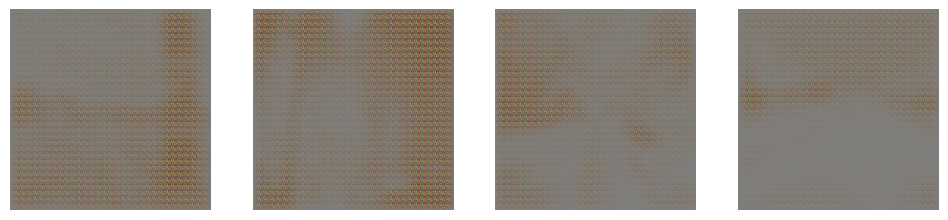

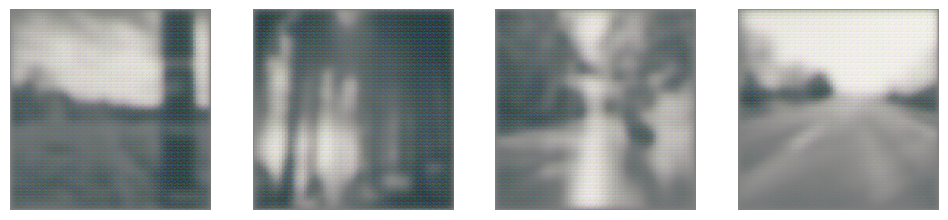

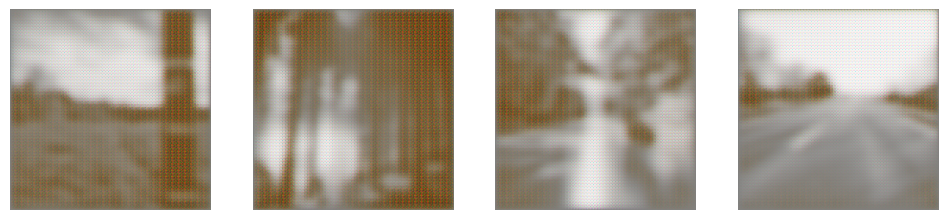

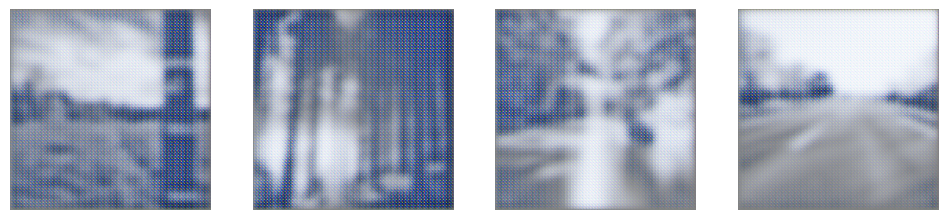

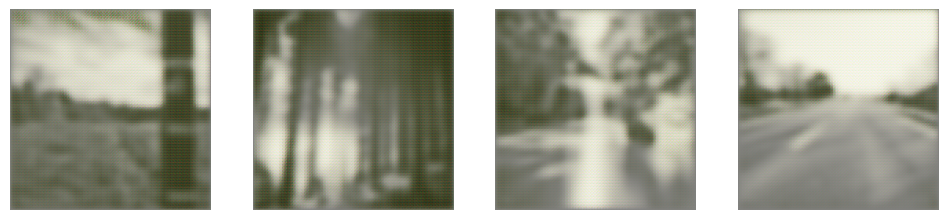

...

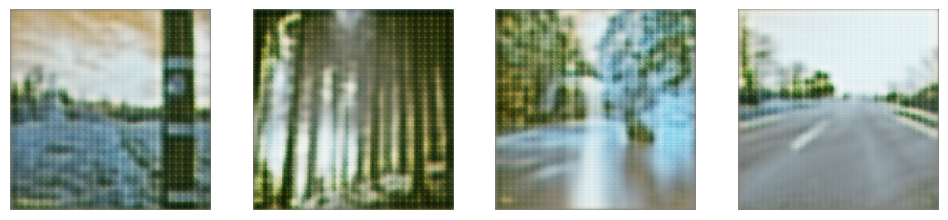

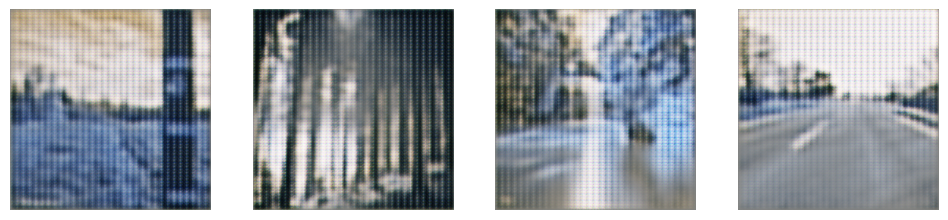

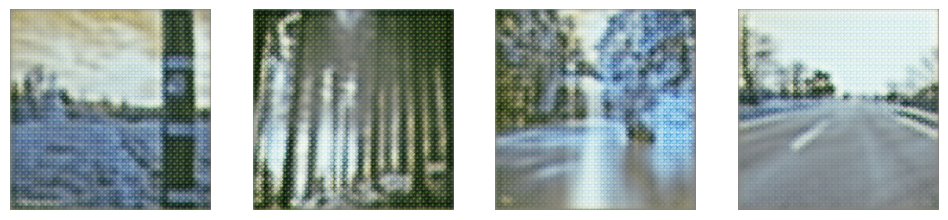

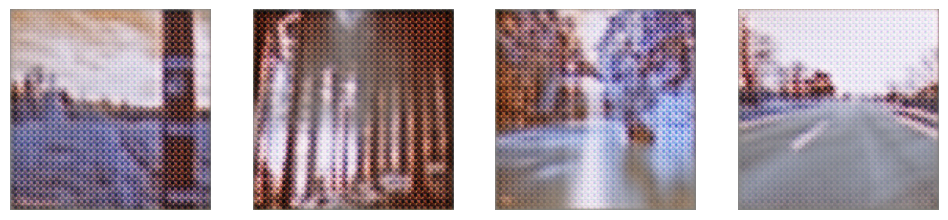

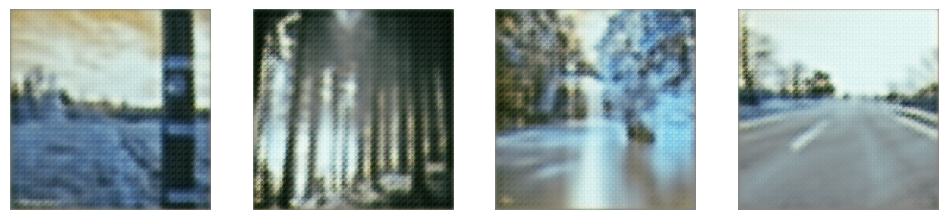

In [19]:
EPOCHS = 100
for epoch in range(EPOCHS):
    for photo, monet in tf.data.Dataset.zip((photo_dataset, monet_dataset)):
        train_step(photo, monet, generator_g, generator_f, discriminator_x, discriminator_y, 
                   generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer)
    # Save generated images to visualize progress
    if epoch % 5 == 0 or epoch == EPOCHS - 1:  # Save images every 5 epochs
        generate_and_save_images(generator_g, epoch, sample_photos[:NUM_SAMPLES])
        generator_g.save('generator_g_model_{}.h5'.format(epoch))

In [20]:
ls

__notebook__.ipynb       generator_g_model_70.h5  image_at_epoch_0040.png
generator_g_model_0.h5   generator_g_model_75.h5  image_at_epoch_0045.png
generator_g_model_10.h5  generator_g_model_80.h5  image_at_epoch_0050.png
generator_g_model_15.h5  generator_g_model_85.h5  image_at_epoch_0055.png
generator_g_model_20.h5  generator_g_model_90.h5  image_at_epoch_0060.png
generator_g_model_25.h5  generator_g_model_95.h5  image_at_epoch_0065.png
generator_g_model_30.h5  generator_g_model_99.h5  image_at_epoch_0070.png
generator_g_model_35.h5  image_at_epoch_0000.png  image_at_epoch_0075.png
generator_g_model_40.h5  image_at_epoch_0005.png  image_at_epoch_0080.png
generator_g_model_45.h5  image_at_epoch_0010.png  image_at_epoch_0085.png
generator_g_model_5.h5   image_at_epoch_0015.png  image_at_epoch_0090.png
generator_g_model_50.h5  image_at_epoch_0020.png  image_at_epoch_0095.png
generator_g_model_55.h5  image_at_epoch_0025.png  image_at_epoch_0099.png
generator_g_model_60.h5  image_at_epoc

In [21]:
generator_g = tf.keras.models.load_model('generator_g_model_99.h5')

In [22]:
def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image)
    image = tf.image.resize(image, [256, 256])
    image = (tf.cast(image, tf.float32) / 127.5) - 1  # Normalize to [-1, 1]
    image = tf.expand_dims(image, 0)  # Add batch dimension
    return image


# Converting the Photos to Monet Paintings:

In [23]:
photo_directory = '/kaggle/input/gan-getting-started/photo_jpg'
output_directory = 'converted'
os.makedirs(output_directory, exist_ok=True)

for filename in os.listdir(photo_directory):
    if filename.endswith(".jpg"):
        image_path = os.path.join(photo_directory, filename)
        input_image = preprocess_image(image_path)
        transformed_image = generator_g.predict(input_image)
        transformed_image = (transformed_image + 1) * 127.5  # Denormalize to [0, 255]
        transformed_image = tf.squeeze(transformed_image).numpy().astype(np.uint8)  # Remove batch dimension and convert to uint8

        # Save the transformed image
        output_path = os.path.join(output_directory, 'monet_' + filename)
        tf.keras.preprocessing.image.save_img(output_path, transformed_image)


1/1 [==============================] - 0s 22ms/step


In [24]:
ls converted/

monet_00068bc07f.jpg  monet_5155be81bf.jpg  monet_a9d902fc38.jpg
monet_000910d219.jpg  monet_51563bc8ab.jpg  monet_a9de4c4d69.jpg
monet_000ded5c41.jpg  monet_516670d194.jpg  monet_a9ef8c2bcd.jpg
monet_00104fd531.jpg  monet_51736e3772.jpg  monet_a9efa619e0.jpg
monet_001158d595.jpg  monet_517eba9d0a.jpg  monet_a9faa93d67.jpg
monet_0033c5f971.jpg  monet_51867bc005.jpg  monet_a9fe1f88ab.jpg
monet_0039ebb598.jpg  monet_5194f65634.jpg  monet_a9ff892ea7.jpg
monet_003aab6fdd.jpg  monet_519d3674c2.jpg  monet_aa0485a59f.jpg
monet_003c6c30e0.jpg  monet_519fc7c17a.jpg  monet_aa09a96ed1.jpg
monet_00479e2a21.jpg  monet_51aa9c9a20.jpg  monet_aa102a3ea1.jpg
monet_005f987f56.jpg  monet_51dc50880b.jpg  monet_aa108bb6da.jpg
monet_0080f94ebc.jpg  monet_51e7037c03.jpg  monet_aa238a7170.jpg
monet_00882b7e1d.jpg  monet_51ede123f3.jpg  monet_aa26ff7c15.jpg
monet_009d534136.jpg  monet_51ffb613ce.jpg  monet_aa2afa7cfe.jpg
monet_009ddaed1f.jpg  monet_52087dc0d6.jpg  monet_aa2b315b55.jpg
monet_00aeb60e25.jpg  mon

## Saving The Pictures:

In [25]:
!zip -r images.zip converted

  adding: converted/ (stored 0%)
  adding: converted/monet_aca45f78be.jpg (deflated 10%)
  adding: converted/monet_26d40b7147.jpg (deflated 16%)
  adding: converted/monet_21e5c1891c.jpg (deflated 22%)
  adding: converted/monet_50b8e79da2.jpg (deflated 10%)
  adding: converted/monet_a26b0f2735.jpg (deflated 8%)
  adding: converted/monet_c4bdcb6dd9.jpg (deflated 5%)
  adding: converted/monet_4abda75494.jpg (deflated 6%)
  adding: converted/monet_17f92dd71b.jpg (deflated 23%)
  adding: converted/monet_8c8961cabb.jpg (deflated 11%)
  adding: converted/monet_5e8afd118f.jpg (deflated 10%)
  adding: converted/monet_74e1d0f495.jpg (deflated 7%)
  adding: converted/monet_61c0bf55f3.jpg (deflated 5%)
  adding: converted/monet_a448539aa0.jpg (deflated 12%)
  adding: converted/monet_cdb621d29d.jpg (deflated 5%)
  adding: converted/monet_e53184b315.jpg (deflated 9%)
  adding: converted/monet_e6a325d8fb.jpg (deflated 10%)
  adding: converted/monet_74342f9fbe.jpg (deflated 9%)
  adding: converted/mon

In [26]:
ls

__notebook__.ipynb       generator_g_model_65.h5  image_at_epoch_0035.png
converted/               generator_g_model_70.h5  image_at_epoch_0040.png
generator_g_model_0.h5   generator_g_model_75.h5  image_at_epoch_0045.png
generator_g_model_10.h5  generator_g_model_80.h5  image_at_epoch_0050.png
generator_g_model_15.h5  generator_g_model_85.h5  image_at_epoch_0055.png
generator_g_model_20.h5  generator_g_model_90.h5  image_at_epoch_0060.png
generator_g_model_25.h5  generator_g_model_95.h5  image_at_epoch_0065.png
generator_g_model_30.h5  generator_g_model_99.h5  image_at_epoch_0070.png
generator_g_model_35.h5  image_at_epoch_0000.png  image_at_epoch_0075.png
generator_g_model_40.h5  image_at_epoch_0005.png  image_at_epoch_0080.png
generator_g_model_45.h5  image_at_epoch_0010.png  image_at_epoch_0085.png
generator_g_model_5.h5   image_at_epoch_0015.png  image_at_epoch_0090.png
generator_g_model_50.h5  image_at_epoch_0020.png  image_at_epoch_0095.png
generator_g_model_55.h5  image_at_epoc

In [27]:
from IPython.display import FileLink
FileLink(r'images.zip')

/kaggle/working/images.zip

## After the training, let's see how they perform:

1/1 [==============================] - 0s 122ms/step


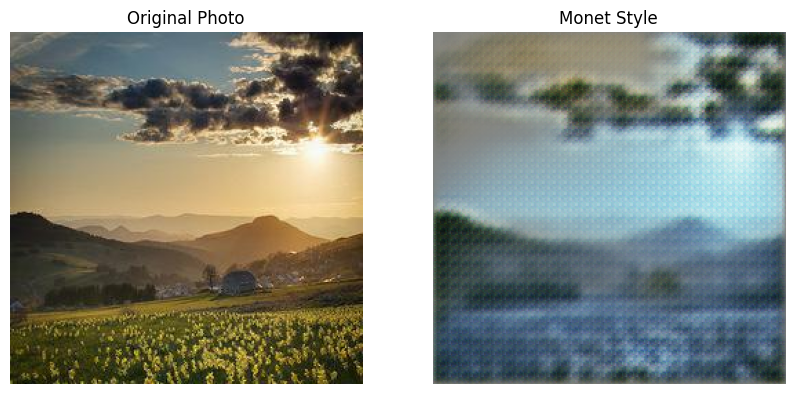

In [28]:
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(256, 256))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = (img / 127.5) - 1.0  # Normalize to the range [-1, 1]
    return img

generator_g = tf.keras.models.load_model('/kaggle/working/generator_g_model_99.h5')
photo_image_path = '/kaggle/input/gan-getting-started/photo_jpg/00068bc07f.jpg'
input_image = preprocess_image(photo_image_path)
transformed_image = generator_g.predict(input_image)
transformed_image = (transformed_image + 1.0) * 127.5
transformed_image = np.clip(transformed_image, 0, 255)
original_image = image.load_img(photo_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Photo')
plt.imshow(original_image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Monet Style')
plt.imshow(transformed_image[0].astype(np.uint8))
plt.axis('off')
plt.show()
